In [163]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns 

In [246]:
init_df = pd.read_pickle('data/Train_Data.pkl')

In [248]:
# cols = [c for c in init_df.columns if c.split('_')[-1] != 'code']
# df = init_df[cols]

In [249]:
init_df.status_group.value_counts()

functional                 24237
non functional             17102
functional needs repair     3211
Name: status_group, dtype: int64

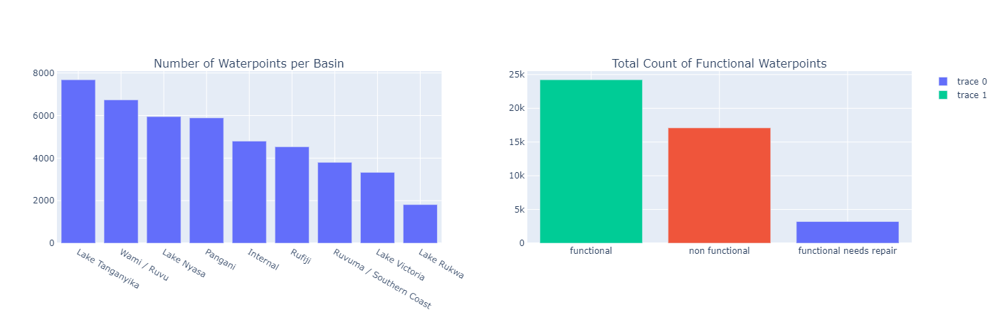

In [281]:
blue = '#636EFA'
red = '#EF553B'
green = '#00CC96'

fig = make_subplots(rows = 1, cols = 2, subplot_titles = ("Number of Waterpoints per Basin", "Total Count of Functional Waterpoints"))

fig.add_trace(go.Bar(
    x = init_df.basin.unique(), y = init_df.basin.value_counts()
    
), 1 , 1)

fig.add_trace(go.Bar(
    x = init_df.status_group.unique(), y = init_df.status_group.value_counts(), marker_color = [green, red, blue]

), 1 , 2)



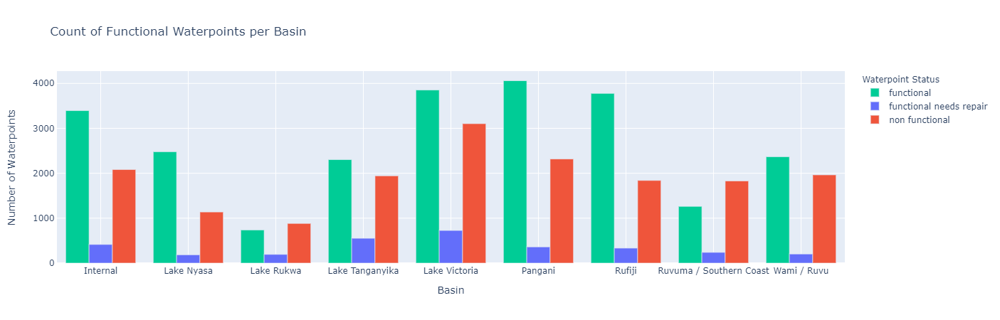

In [275]:
#restructuring data for bar chart
bar_df = init_df.groupby(['basin', 'status_group']).count().reset_index()
px.bar(bar_df, x = 'basin', y = 'date_recorded', barmode = 'group', color = 'status_group', color_discrete_sequence=[green, blue, red],
        title = "Count of Functional Waterpoints per Basin", 
      labels = {"basin" : "Basin", 'date_recorded' : "Number of Waterpoints", 'status_group' : "Waterpoint Status"})

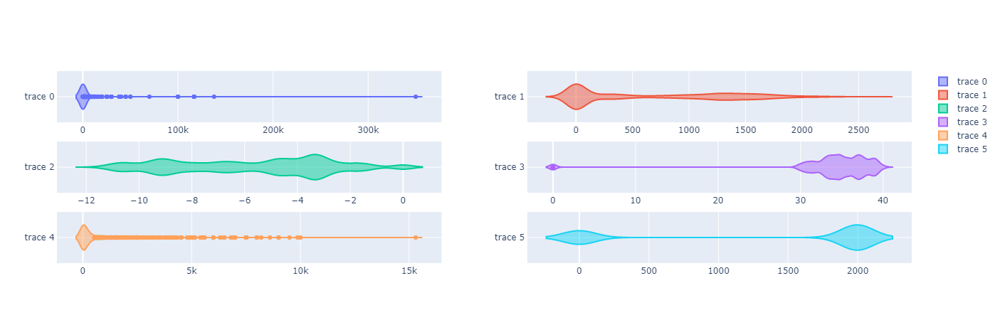

In [276]:
vio_fig = make_subplots(rows = 3, cols = 2)


vio_fig.add_trace(go.Violin(x = init_df.amount_tsh), 1, 1)
vio_fig.add_trace(go.Violin(x = init_df.gps_height), 1, 2)
vio_fig.add_trace(go.Violin(x = init_df.latitude), 2, 1)
vio_fig.add_trace(go.Violin(x = init_df.longitude), 2, 2)
vio_fig.add_trace(go.Violin(x = init_df.population), 3, 1)
vio_fig.add_trace(go.Violin(x = init_df.construction_year), 3, 2)

In [254]:
numeric_features

,amount_tsh,gps_height,latitude,longitude,population,construction_year
0,0,1295,-3.57407,30.6172,120,2001
1,50,181,-6.64235,38.354,50,2011
2,300,490,-6.75865,37.0489,500,2011
3,1000,2047,-9.58192,34.4419,11,2006
4,500,644,-4.4549,37.8761,150,2012
...,...,...,...,...,...,...
44545,1000,0,-4.86036,38.7995,20,2010
44546,0,1618,-5.08732,34.974,1,1980
44547,0,-28,-6.87646,39.3854,50,2000
44548,20000,1970,-9.33041,34.7134,400,2009


In [283]:
# numeric_features = init_df[['amount_tsh', 'gps_height', 'latitude', 'longitude',
#                                 'population', 'construction_year']]
# sns.set(style='whitegrid')

# for col in numeric_features:
#     fig, ax = plt.subplots(figsize=(6,3))
#     sns.violinplot(x=numeric_features[col])

#somehow this one broke and i dont know how to fix it

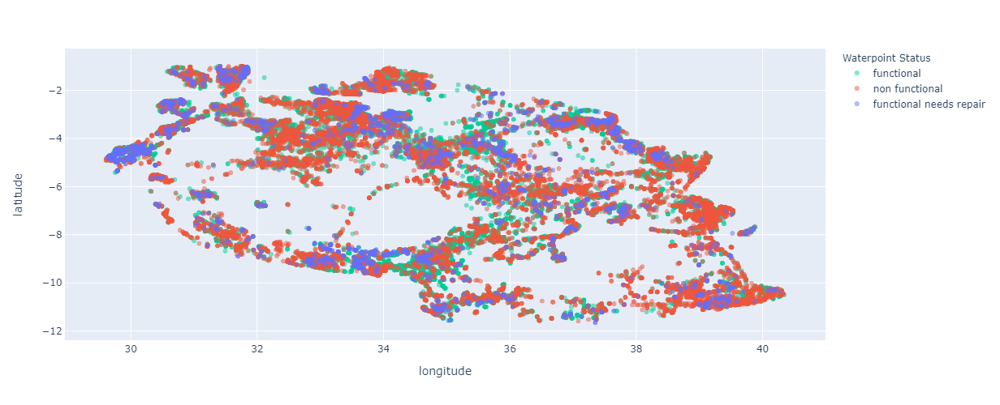

In [282]:
scatter_df = init_df.drop(init_df[init_df.longitude == 0].index)

px.scatter(scatter_df,"longitude", "latitude", width = 700, height = 500, color = "status_group", opacity = .5, color_discrete_sequence = [green, red, blue],
      labels = {'status_group' : 'Waterpoint Status'})

In [284]:
# pd.plotting.scatter_matrix(df, alpha=0.5, figsize=(30,30));
#Thiiiis one broke as well